# Osama Gamal Sleem

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as exp
import plotly.graph_objects as go
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer,SimpleImputer,KNNImputer
from plotly.subplots import make_subplots
from sklearn.preprocessing import RobustScaler,StandardScaler,MinMaxScaler,LabelEncoder

In [2]:
df = pd.read_csv('Melbourne_housing_FULL.csv',sep = ',',encoding='utf-8')
df

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,68 Studley St,2,h,NaN,SS,Jellis,3/9/2016,2.5,3067.0,...,1.0,1.0,126.0,NaN,NaN,Yarra City Council,-37.80140,144.99580,Northern Metropolitan,4019.0
1,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra City Council,-37.79960,144.99840,Northern Metropolitan,4019.0
2,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/2/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra City Council,-37.80790,144.99340,Northern Metropolitan,4019.0
3,Abbotsford,18/659 Victoria St,3,u,NaN,VB,Rounds,4/2/2016,2.5,3067.0,...,2.0,1.0,0.0,NaN,NaN,Yarra City Council,-37.81140,145.01160,Northern Metropolitan,4019.0
4,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/3/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra City Council,-37.80930,144.99440,Northern Metropolitan,4019.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34852,Yarraville,13 Burns St,4,h,1480000.0,PI,Jas,24/02/2018,6.3,3013.0,...,1.0,3.0,593.0,NaN,NaN,Maribyrnong City Council,-37.81053,144.88467,Western Metropolitan,6543.0
34853,Yarraville,29A Murray St,2,h,888000.0,SP,Sweeney,24/02/2018,6.3,3013.0,...,2.0,1.0,98.0,104.0,2018.0,Maribyrnong City Council,-37.81551,144.88826,Western Metropolitan,6543.0
34854,Yarraville,147A Severn St,2,t,705000.0,S,Jas,24/02/2018,6.3,3013.0,...,1.0,2.0,220.0,120.0,2000.0,Maribyrnong City Council,-37.82286,144.87856,Western Metropolitan,6543.0
34855,Yarraville,12/37 Stephen St,3,h,1140000.0,SP,hockingstuart,24/02/2018,6.3,3013.0,...,NaN,NaN,NaN,NaN,NaN,Maribyrnong City Council,NaN,NaN,Western Metropolitan,6543.0


In [3]:
df.columns

Index(['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG',
       'Date', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car',
       'Landsize', 'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude',
       'Longtitude', 'Regionname', 'Propertycount'],
      dtype='object')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34857 entries, 0 to 34856
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         34857 non-null  object 
 1   Address        34857 non-null  object 
 2   Rooms          34857 non-null  int64  
 3   Type           34857 non-null  object 
 4   Price          27247 non-null  float64
 5   Method         34857 non-null  object 
 6   SellerG        34857 non-null  object 
 7   Date           34857 non-null  object 
 8   Distance       34856 non-null  float64
 9   Postcode       34856 non-null  float64
 10  Bedroom2       26640 non-null  float64
 11  Bathroom       26631 non-null  float64
 12  Car            26129 non-null  float64
 13  Landsize       23047 non-null  float64
 14  BuildingArea   13742 non-null  float64
 15  YearBuilt      15551 non-null  float64
 16  CouncilArea    34854 non-null  object 
 17  Lattitude      26881 non-null  float64
 18  Longti

In [5]:
df.isnull().sum()

Suburb               0
Address              0
Rooms                0
Type                 0
Price             7610
Method               0
SellerG              0
Date                 0
Distance             1
Postcode             1
Bedroom2          8217
Bathroom          8226
Car               8728
Landsize         11810
BuildingArea     21115
YearBuilt        19306
CouncilArea          3
Lattitude         7976
Longtitude        7976
Regionname           3
Propertycount        3
dtype: int64

In [6]:
for i in df.columns:
    if df[i].isnull().any():
        nullperc = df[i].isnull().sum()/df[i].shape[0] * 100
        print(f'null percentage of {i} is {round(nullperc,ndigits=3)}')


null percentage of Price is 21.832
null percentage of Distance is 0.003
null percentage of Postcode is 0.003
null percentage of Bedroom2 is 23.573
null percentage of Bathroom is 23.599
null percentage of Car is 25.039
null percentage of Landsize is 33.881
null percentage of BuildingArea is 60.576
null percentage of YearBuilt is 55.386
null percentage of CouncilArea is 0.009
null percentage of Lattitude is 22.882
null percentage of Longtitude is 22.882
null percentage of Regionname is 0.009
null percentage of Propertycount is 0.009


More than half of data is Missed from these two columns (BuildingArea,YearBuilt) so I will drop it

In [7]:
clean_data = df.drop(['BuildingArea','YearBuilt'],axis = 1)

In [8]:
clean_data.dropna(thresh=14)

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,68 Studley St,2,h,NaN,SS,Jellis,3/9/2016,2.5,3067.0,2.0,1.0,1.0,126.0,Yarra City Council,-37.80140,144.99580,Northern Metropolitan,4019.0
1,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,2.0,1.0,1.0,202.0,Yarra City Council,-37.79960,144.99840,Northern Metropolitan,4019.0
2,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/2/2016,2.5,3067.0,2.0,1.0,0.0,156.0,Yarra City Council,-37.80790,144.99340,Northern Metropolitan,4019.0
3,Abbotsford,18/659 Victoria St,3,u,NaN,VB,Rounds,4/2/2016,2.5,3067.0,3.0,2.0,1.0,0.0,Yarra City Council,-37.81140,145.01160,Northern Metropolitan,4019.0
4,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/3/2017,2.5,3067.0,3.0,2.0,0.0,134.0,Yarra City Council,-37.80930,144.99440,Northern Metropolitan,4019.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34851,Yarraville,78 Bayview Rd,3,h,1101000.0,S,Jas,24/02/2018,6.3,3013.0,3.0,1.0,NaN,288.0,Maribyrnong City Council,-37.81095,144.88516,Western Metropolitan,6543.0
34852,Yarraville,13 Burns St,4,h,1480000.0,PI,Jas,24/02/2018,6.3,3013.0,4.0,1.0,3.0,593.0,Maribyrnong City Council,-37.81053,144.88467,Western Metropolitan,6543.0
34853,Yarraville,29A Murray St,2,h,888000.0,SP,Sweeney,24/02/2018,6.3,3013.0,2.0,2.0,1.0,98.0,Maribyrnong City Council,-37.81551,144.88826,Western Metropolitan,6543.0
34854,Yarraville,147A Severn St,2,t,705000.0,S,Jas,24/02/2018,6.3,3013.0,2.0,1.0,2.0,220.0,Maribyrnong City Council,-37.82286,144.87856,Western Metropolitan,6543.0


In [9]:
clean_data.dropna(thresh=13,inplace=True)

In [10]:
clean_data.isnull().sum()

Suburb               0
Address              0
Rooms                0
Type                 0
Price             5892
Method               0
SellerG              0
Date                 0
Distance             0
Postcode             0
Bedroom2          6496
Bathroom          6505
Car               7007
Landsize         10089
CouncilArea          0
Lattitude         6255
Longtitude        6255
Regionname           0
Propertycount        0
dtype: int64

In [11]:
exp.box(clean_data['Price'])

<AxesSubplot:xlabel='Price', ylabel='Count'>

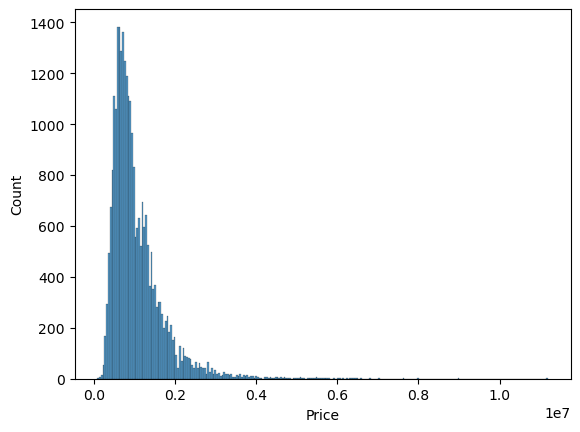

In [12]:
sns.histplot(x =df['Price'])

<AxesSubplot:title={'center':'Polynomial'}, ylabel='Frequency'>

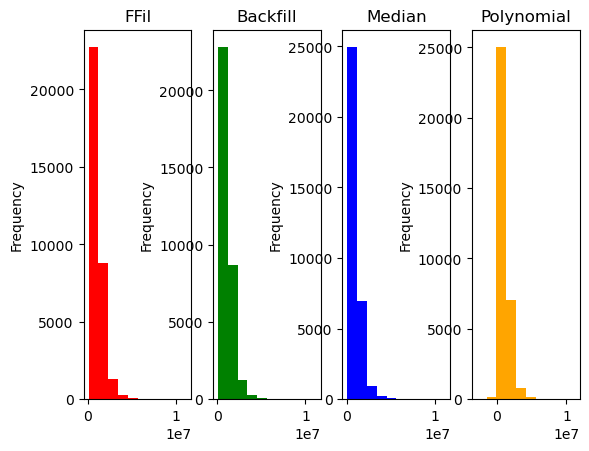

In [13]:
plt.subplot(1,4,1)
plt.title('FFil')
clean_data['Price'].fillna(method='ffill').plot(kind='hist',color = 'red')
plt.subplot(1,4,2)
plt.title('Backfill')
clean_data['Price'].fillna(method='backfill').plot(kind='hist',color = 'green')
plt.subplot(1,4,3)
plt.title('Median')
clean_data['Price'].fillna(clean_data['Price'].median()).plot(kind='hist',color = 'b')
plt.subplot(1,4,4)
plt.title('Polynomial')
clean_data['Price'].interpolate(method='polynomial',order =3).plot(kind='hist',color = 'orange')


In [11]:
clean_data['Price'] = clean_data['Price'].fillna(clean_data['Price'].median())

In [12]:
clean_data['Price'].isnull().sum()

0

In [13]:
exp.scatter(x=clean_data['Landsize'],y=clean_data['Price'],color_discrete_sequence=['red'])

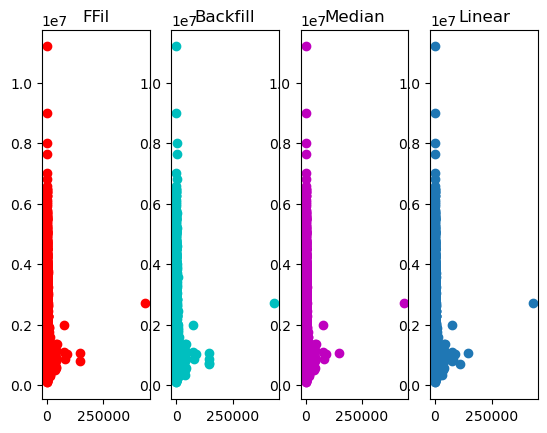

In [17]:
plt.subplot(1,4,1)
plt.title('FFil')
n = clean_data['Landsize'].fillna(method='ffill')
plt.scatter(x = n ,y = clean_data['Price'],color = 'red')
plt.subplot(1,4,2)
plt.title('Backfill')
n = clean_data['Landsize'].fillna(method='backfill')
plt.scatter(x = n ,y = clean_data['Price'],color = 'c')
plt.subplot(1,4,3)
plt.title('Median')
n = clean_data['Landsize'].fillna(clean_data['Landsize'].median())
plt.scatter(x = n ,y = clean_data['Price'],color = 'm')
plt.subplot(1,4,4)
plt.title('Linear')
n = clean_data['Landsize'].interpolate(method='linear')
plt.scatter(x = n ,y = clean_data['Price'])

In [13]:
clean_data['Landsize'] = clean_data['Landsize'].fillna(method='backfill')
clean_data['Landsize'].isnull().sum()

0

In [14]:
clean_data.isnull().sum()

Suburb              0
Address             0
Rooms               0
Type                0
Price               0
Method              0
SellerG             0
Date                0
Distance            0
Postcode            0
Bedroom2         6496
Bathroom         6505
Car              7007
Landsize            0
CouncilArea         0
Lattitude        6255
Longtitude       6255
Regionname          0
Propertycount       0
dtype: int64

In [20]:
exp.box(clean_data["Car"],color_discrete_sequence=['goldenrod'])


c:\Users\jamal\anaconda32\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

c:\Users\jamal\anaconda32\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

c:\Users\jamal\anaconda32\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:title={'center':'Iterative Imputer'}>

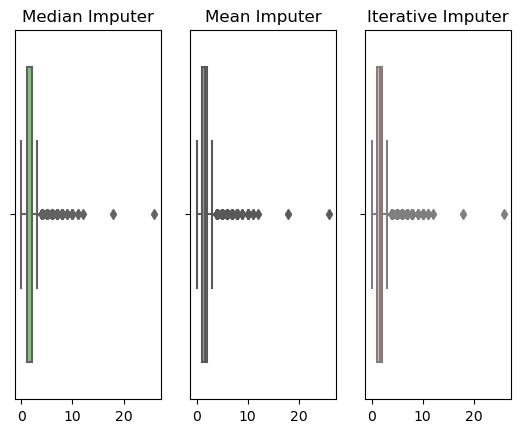

In [21]:
plt.subplot(1,3,1)
plt.title('Median Imputer')
imp1 = SimpleImputer(strategy='median')
n = (imp1.fit_transform(clean_data[['Car']]))
sns.boxplot(n,palette='Accent')
plt.subplot(1,3,2)
plt.title('Mean Imputer')
imp2 = SimpleImputer(strategy='mean')
n = (imp2.fit_transform(clean_data[['Car']]))
sns.boxplot( n ,palette='BuGn')
plt.subplot(1,3,3)
plt.title('Iterative Imputer')
imp3 = IterativeImputer()
n = (imp3.fit_transform(clean_data[['Car']]))
sns.boxplot(n ,palette='Pastel1')

In [15]:
imp3 = IterativeImputer()
clean_data['Car'] =  (imp3.fit_transform(clean_data[['Car']]))


In [16]:
clean_data.isnull().sum()

Suburb              0
Address             0
Rooms               0
Type                0
Price               0
Method              0
SellerG             0
Date                0
Distance            0
Postcode            0
Bedroom2         6496
Bathroom         6505
Car                 0
Landsize            0
CouncilArea         0
Lattitude        6255
Longtitude       6255
Regionname          0
Propertycount       0
dtype: int64

In [24]:
exp.box(clean_data["Bedroom2"],color_discrete_sequence=['magenta'])

In [25]:
exp.box(clean_data["Bathroom"],color_discrete_sequence=['green'])

In [26]:
fig = make_subplots(rows=1, cols=3)

imp = KNNImputer(n_neighbors=2)
n = imp.fit_transform(clean_data[['Bathroom']])
fig.add_trace(
    go.Box(y=n.flatten(), name='KNN Imputer'),
    row=1, col=1
)
imp = IterativeImputer()
n = imp.fit_transform(clean_data[['Bathroom']])
fig.add_trace(
    go.Box(y=n.flatten(), name='Iterative Imputer'),
    row=1, col=2
)

imp = SimpleImputer(strategy='median')
n = imp.fit_transform(clean_data[['Bathroom']])
fig.add_trace(
    go.Box(y=n.flatten(), name='Median Imputer'),
    row=1, col=3
)

fig.update_layout(title='Bathroom imputation', showlegend=False)

fig.show()


In [17]:
imp = SimpleImputer(strategy='median')
clean_data['Bathroom'] = imp.fit_transform(clean_data[['Bathroom']])

In [18]:
clean_data.isnull().sum()

Suburb              0
Address             0
Rooms               0
Type                0
Price               0
Method              0
SellerG             0
Date                0
Distance            0
Postcode            0
Bedroom2         6496
Bathroom            0
Car                 0
Landsize            0
CouncilArea         0
Lattitude        6255
Longtitude       6255
Regionname          0
Propertycount       0
dtype: int64

In [29]:
fig = make_subplots(rows=1, cols=4)

imp = KNNImputer(n_neighbors=2)
n = imp.fit_transform(clean_data[['Bedroom2']])
fig.add_trace(
    go.Box(y=n.flatten(), name='KNN Imputer',marker_color = '#0d0887'),
    row=1, col=1
)
imp = IterativeImputer()
n = imp.fit_transform(clean_data[['Bedroom2']])
fig.add_trace(
    go.Box(y=n.flatten(), name='Iterative Imputer',marker_color = '#46039f'),
    row=1, col=2
)

imp = SimpleImputer(strategy='median')
n = imp.fit_transform(clean_data[['Bedroom2']])
fig.add_trace(
    go.Box(y=n.flatten(), name='Median Imputer',marker_color = '#7201a8'),
    row=1, col=3
)
n = clean_data['Bedroom2'].fillna(method='ffill')
fig.add_trace(
    go.Box(y=n, name='ffil method',marker_color = '#9c179e'),
    row=1, col=4
)
fig.update_layout(title='Bedroom imputation', showlegend=False)

fig.show()


In [19]:
clean_data['Bedroom2'] = clean_data['Bedroom2'].fillna(method='ffill')

In [20]:
clean_data.isnull().sum()

Suburb              0
Address             0
Rooms               0
Type                0
Price               0
Method              0
SellerG             0
Date                0
Distance            0
Postcode            0
Bedroom2            0
Bathroom            0
Car                 0
Landsize            0
CouncilArea         0
Lattitude        6255
Longtitude       6255
Regionname          0
Propertycount       0
dtype: int64

In [21]:
exp.box(clean_data["Lattitude"],color_discrete_sequence=['#bd3786'])

In [33]:
exp.box(clean_data["Longtitude"],color_discrete_sequence=['#d8576b'])

In [34]:
fig = make_subplots(rows=1, cols=2)

n = clean_data['Lattitude'].fillna(method='ffill')

fig.add_trace(
    go.Box(y=n, name='Lattitude by ffill method',marker_color = '#ed7953'),
    row=1, col=1
)
n = clean_data['Longtitude'].fillna(method='ffill')
fig.add_trace(
    go.Box(y=n, name='Longitude by ffill method',marker_color = '#fb9f3a'),
    row=1, col=2
)

fig.update_layout(title='Bedroom imputation', showlegend=False)

fig.show()


In [21]:
clean_data['Lattitude']= clean_data['Lattitude'].fillna(method='ffill')
clean_data['Longtitude'] = clean_data['Longtitude'].fillna(method='ffill')

In [22]:
clean_data.isnull().sum()

Suburb           0
Address          0
Rooms            0
Type             0
Price            0
Method           0
SellerG          0
Date             0
Distance         0
Postcode         0
Bedroom2         0
Bathroom         0
Car              0
Landsize         0
CouncilArea      0
Lattitude        0
Longtitude       0
Regionname       0
Propertycount    0
dtype: int64

Rooms               AxesSubplot(0.125,0.712609;0.227941x0.167391)
Price            AxesSubplot(0.398529,0.712609;0.227941x0.167391)
Distance         AxesSubplot(0.672059,0.712609;0.227941x0.167391)
Postcode            AxesSubplot(0.125,0.511739;0.227941x0.167391)
Bedroom2         AxesSubplot(0.398529,0.511739;0.227941x0.167391)
Bathroom         AxesSubplot(0.672059,0.511739;0.227941x0.167391)
Car                  AxesSubplot(0.125,0.31087;0.227941x0.167391)
Landsize          AxesSubplot(0.398529,0.31087;0.227941x0.167391)
Lattitude         AxesSubplot(0.672059,0.31087;0.227941x0.167391)
Longtitude              AxesSubplot(0.125,0.11;0.227941x0.167391)
Propertycount        AxesSubplot(0.398529,0.11;0.227941x0.167391)
dtype: object

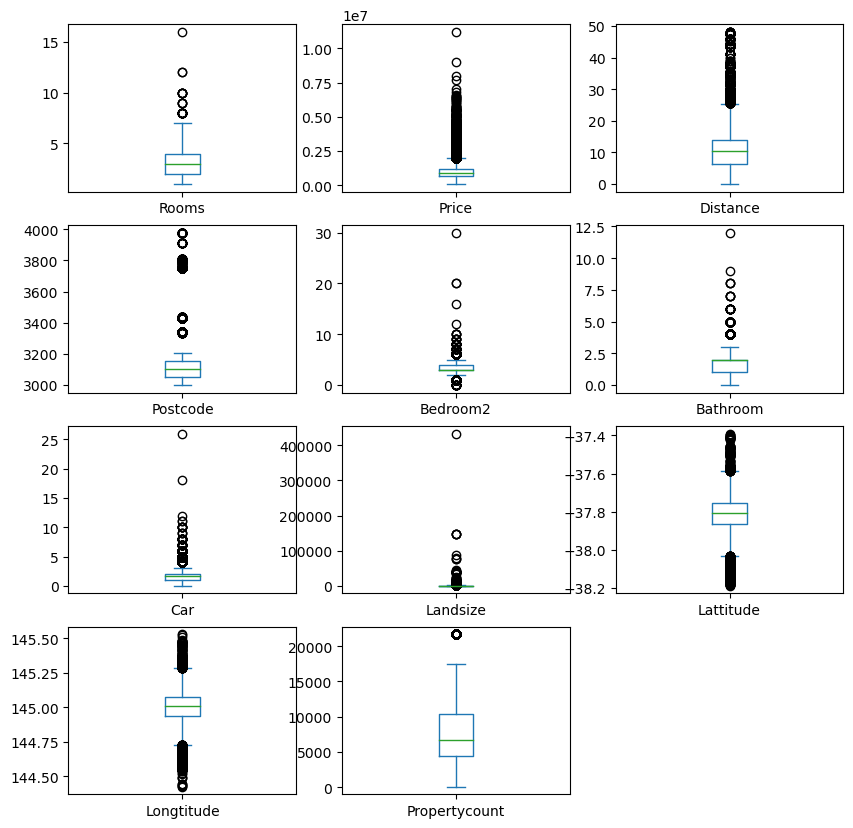

In [33]:
clean_data.plot(kind = "box" , subplots = True , figsize = (10,10) , layout = (4,3))

In [46]:
rob = RobustScaler()
# no_outlier = clean_data.copy()
for i in no_outlier.columns:
    if no_outlier[i].dtype != 'object':
        no_outlier[i] = rob.fit_transform(no_outlier[[i]])

Suburb              AxesSubplot(0.125,0.712609;0.133621x0.167391)
Address          AxesSubplot(0.285345,0.712609;0.133621x0.167391)
Rooms             AxesSubplot(0.44569,0.712609;0.133621x0.167391)
Type             AxesSubplot(0.606034,0.712609;0.133621x0.167391)
Price            AxesSubplot(0.766379,0.712609;0.133621x0.167391)
Method              AxesSubplot(0.125,0.511739;0.133621x0.167391)
SellerG          AxesSubplot(0.285345,0.511739;0.133621x0.167391)
Distance          AxesSubplot(0.44569,0.511739;0.133621x0.167391)
Postcode         AxesSubplot(0.606034,0.511739;0.133621x0.167391)
Bedroom2         AxesSubplot(0.766379,0.511739;0.133621x0.167391)
Bathroom             AxesSubplot(0.125,0.31087;0.133621x0.167391)
Car               AxesSubplot(0.285345,0.31087;0.133621x0.167391)
Landsize           AxesSubplot(0.44569,0.31087;0.133621x0.167391)
CouncilArea       AxesSubplot(0.606034,0.31087;0.133621x0.167391)
Lattitude         AxesSubplot(0.766379,0.31087;0.133621x0.167391)
Longtitude

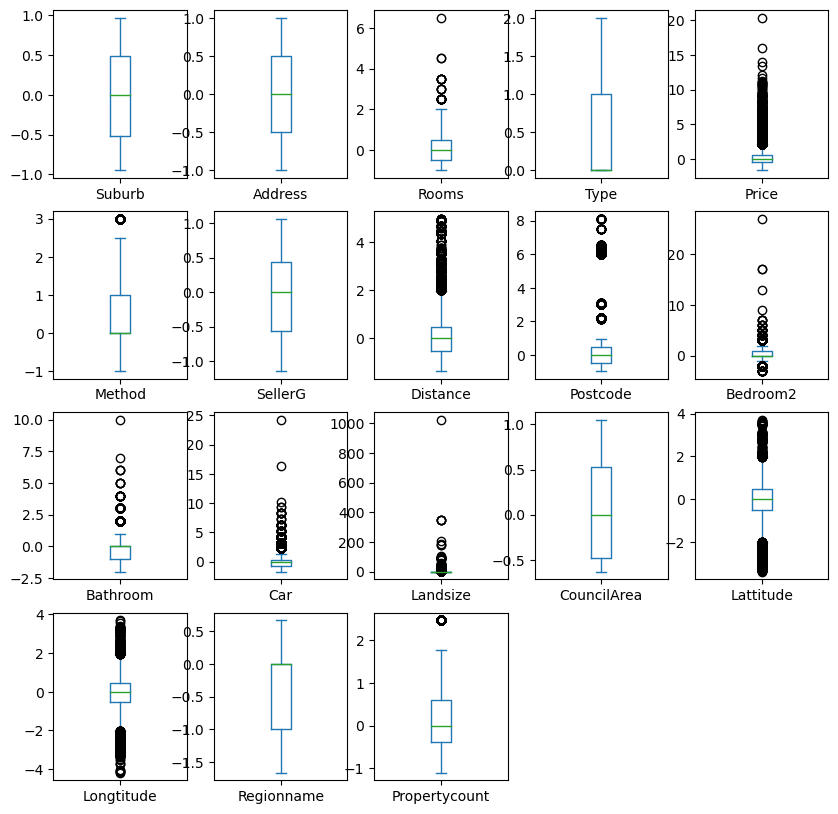

In [47]:
no_outlier.plot(kind = "box" , subplots = True , figsize = (10,10) , layout = (4,5))

In [40]:
scaler = StandardScaler()
no_outlier = clean_data.copy()
for i in no_outlier.columns:
    if no_outlier[i].dtype != 'object':
        no_outlier[i] = scaler.fit_transform(no_outlier[[i]])

Rooms               AxesSubplot(0.125,0.712609;0.227941x0.167391)
Price            AxesSubplot(0.398529,0.712609;0.227941x0.167391)
Distance         AxesSubplot(0.672059,0.712609;0.227941x0.167391)
Postcode            AxesSubplot(0.125,0.511739;0.227941x0.167391)
Bedroom2         AxesSubplot(0.398529,0.511739;0.227941x0.167391)
Bathroom         AxesSubplot(0.672059,0.511739;0.227941x0.167391)
Car                  AxesSubplot(0.125,0.31087;0.227941x0.167391)
Landsize          AxesSubplot(0.398529,0.31087;0.227941x0.167391)
Lattitude         AxesSubplot(0.672059,0.31087;0.227941x0.167391)
Longtitude              AxesSubplot(0.125,0.11;0.227941x0.167391)
Propertycount        AxesSubplot(0.398529,0.11;0.227941x0.167391)
dtype: object

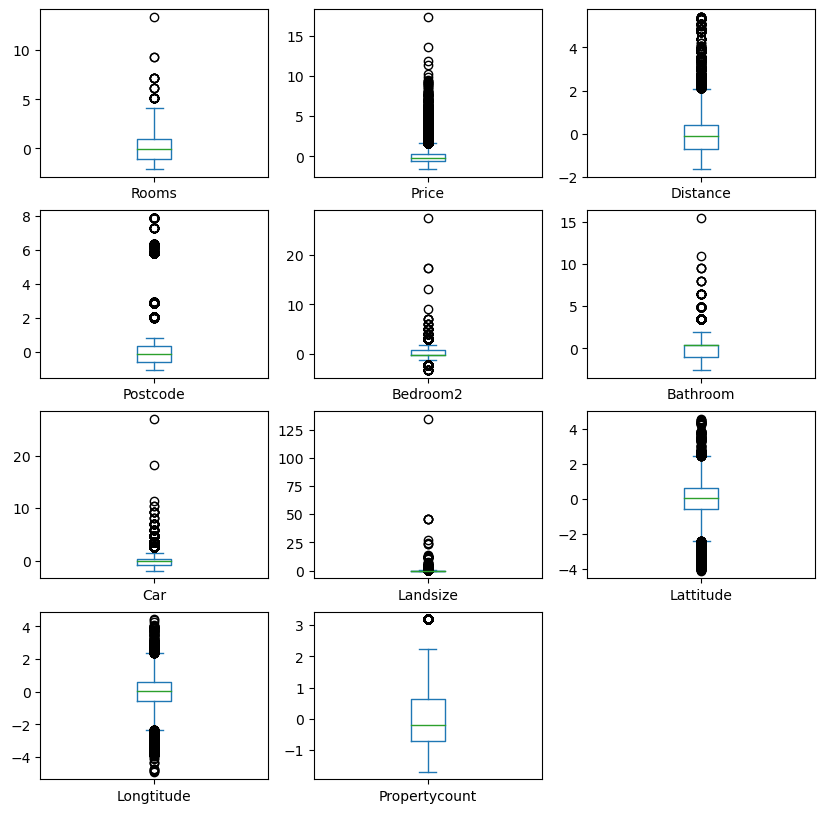

In [41]:
no_outlier.plot(kind = "box" , subplots = True , figsize = (10,10) , layout = (4,3))

In [42]:
scaler = StandardScaler()
no_outlier = clean_data.copy()
for i in no_outlier.columns:
    if no_outlier[i].dtype != 'object':
        no_outlier[i] = scaler.fit_transform(no_outlier[[i]])

Rooms               AxesSubplot(0.125,0.712609;0.227941x0.167391)
Price            AxesSubplot(0.398529,0.712609;0.227941x0.167391)
Distance         AxesSubplot(0.672059,0.712609;0.227941x0.167391)
Postcode            AxesSubplot(0.125,0.511739;0.227941x0.167391)
Bedroom2         AxesSubplot(0.398529,0.511739;0.227941x0.167391)
Bathroom         AxesSubplot(0.672059,0.511739;0.227941x0.167391)
Car                  AxesSubplot(0.125,0.31087;0.227941x0.167391)
Landsize          AxesSubplot(0.398529,0.31087;0.227941x0.167391)
Lattitude         AxesSubplot(0.672059,0.31087;0.227941x0.167391)
Longtitude              AxesSubplot(0.125,0.11;0.227941x0.167391)
Propertycount        AxesSubplot(0.398529,0.11;0.227941x0.167391)
dtype: object

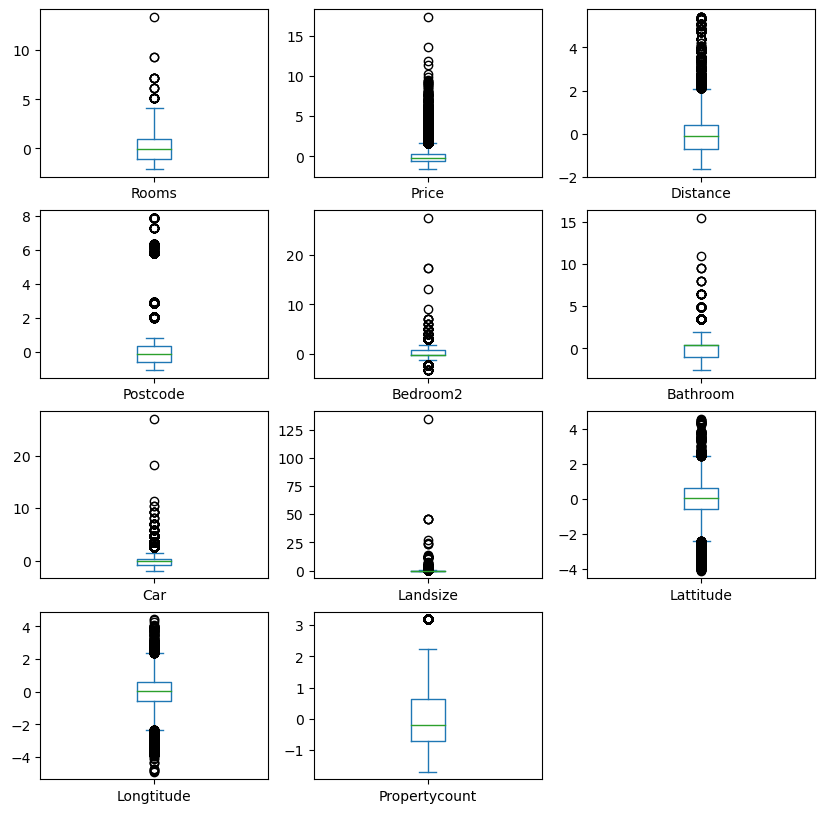

In [43]:
no_outlier.plot(kind = "box" , subplots = True , figsize = (10,10) , layout = (4,3))

In [23]:
no_outlier = clean_data.copy()

In [28]:
no_outlier.describe(include='O')

,Suburb,Address,Type,Method,SellerG,Date,CouncilArea,Regionname
count,33136,33136,33136,33136,33136,33136,33136,33136
unique,349,32349,3,9,383,78,33,8
top,Reservoir,5 Charles St,h,S,Jellis,28/10/2017,Boroondara City Council,Southern Metropolitan
freq,802,6,23192,19291,3169,1061,3412,11063


In [24]:
sub = LabelEncoder()
add = LabelEncoder()
ty = LabelEncoder()
me = LabelEncoder()
sel = LabelEncoder()
cou = LabelEncoder()
reg = LabelEncoder()

In [25]:
no_outlier['Suburb'] = sub.fit_transform(no_outlier['Suburb'])
no_outlier['Address'] = add.fit_transform(no_outlier['Address'])
no_outlier['Type'] = ty.fit_transform(no_outlier['Type'])
no_outlier['Method'] = me.fit_transform(no_outlier['Method'])
no_outlier['SellerG'] = sel.fit_transform(no_outlier['SellerG'])
no_outlier['CouncilArea'] = cou.fit_transform(no_outlier['CouncilArea'])
no_outlier['Regionname'] = reg.fit_transform(no_outlier['Regionname'])

In [26]:
no_outlier.isnull().sum()

Suburb           0
Address          0
Rooms            0
Type             0
Price            0
Method           0
SellerG          0
Date             0
Distance         0
Postcode         0
Bedroom2         0
Bathroom         0
Car              0
Landsize         0
CouncilArea      0
Lattitude        0
Longtitude       0
Regionname       0
Propertycount    0
dtype: int64

In [42]:
Q1 = no_outlier.quantile(0.25)
Q3 = no_outlier.quantile(0.75)

In [44]:
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
Upper_bound = Q3 + 1.5 * IQR
filtered = no_outlier.copy()
filtered = no_outlier[(no_outlier>= lower_bound) & (no_outlier<= Upper_bound)]
filtered

C:\Users\jamal\AppData\Local\Temp\ipykernel_2176\3211092995.py:7: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  filtered = no_outlier[(no_outlier>= lower_bound) & (no_outlier<= Upper_bound)]


Suburb               0
Address              0
Rooms               31
Type                 0
Price             2042
Method             133
SellerG              0
Date             33136
Distance          1419
Postcode           927
Bedroom2          1450
Bathroom           371
Car               1514
Landsize           827
CouncilArea          0
Lattitude          783
Longtitude        1211
Regionname           0
Propertycount      802
dtype: int64

In [45]:
no_outlier.isnull().sum()

Suburb           0
Address          0
Rooms            0
Type             0
Price            0
Method           0
SellerG          0
Date             0
Distance         0
Postcode         0
Bedroom2         0
Bathroom         0
Car              0
Landsize         0
CouncilArea      0
Lattitude        0
Longtitude       0
Regionname       0
Propertycount    0
dtype: int64

Suburb              AxesSubplot(0.125,0.712609;0.133621x0.167391)
Address          AxesSubplot(0.285345,0.712609;0.133621x0.167391)
Rooms             AxesSubplot(0.44569,0.712609;0.133621x0.167391)
Type             AxesSubplot(0.606034,0.712609;0.133621x0.167391)
Price            AxesSubplot(0.766379,0.712609;0.133621x0.167391)
Method              AxesSubplot(0.125,0.511739;0.133621x0.167391)
SellerG          AxesSubplot(0.285345,0.511739;0.133621x0.167391)
Distance          AxesSubplot(0.44569,0.511739;0.133621x0.167391)
Postcode         AxesSubplot(0.606034,0.511739;0.133621x0.167391)
Bedroom2         AxesSubplot(0.766379,0.511739;0.133621x0.167391)
Bathroom             AxesSubplot(0.125,0.31087;0.133621x0.167391)
Car               AxesSubplot(0.285345,0.31087;0.133621x0.167391)
Landsize           AxesSubplot(0.44569,0.31087;0.133621x0.167391)
CouncilArea       AxesSubplot(0.606034,0.31087;0.133621x0.167391)
Lattitude         AxesSubplot(0.766379,0.31087;0.133621x0.167391)
Longtitude

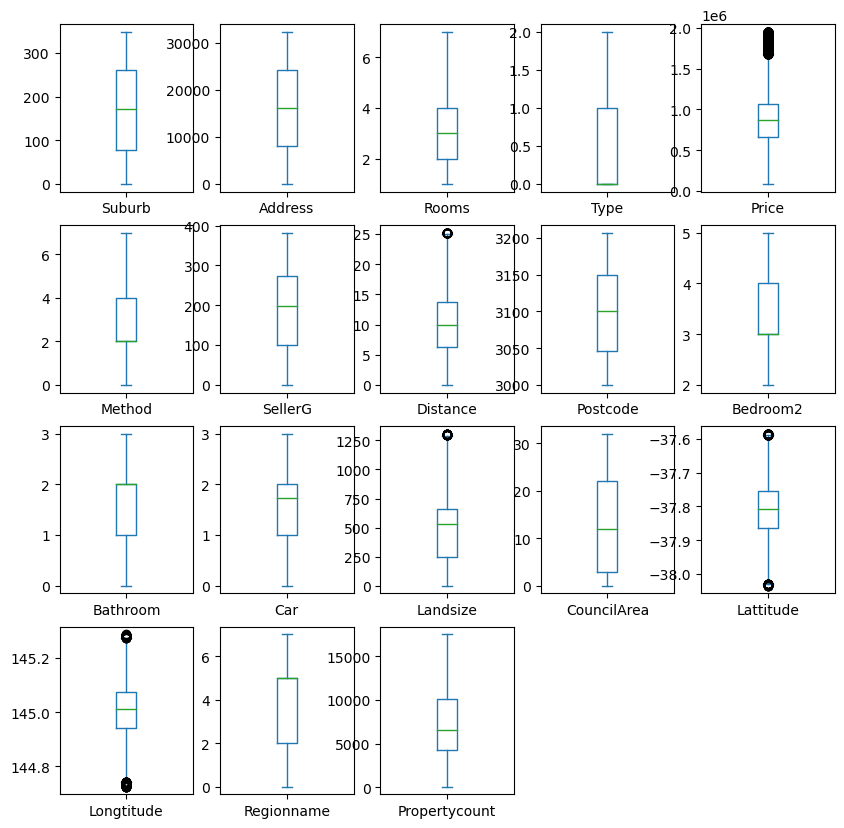

In [28]:
filtered.plot(kind = "box" , subplots = True , figsize = (10,10) , layout = (4,5))

In [66]:
exp.box(filtered['Price'])

In [70]:
filtered = filtered[filtered['Price'] <= 1700000]

Suburb              AxesSubplot(0.125,0.712609;0.133621x0.167391)
Address          AxesSubplot(0.285345,0.712609;0.133621x0.167391)
Rooms             AxesSubplot(0.44569,0.712609;0.133621x0.167391)
Type             AxesSubplot(0.606034,0.712609;0.133621x0.167391)
Price            AxesSubplot(0.766379,0.712609;0.133621x0.167391)
Method              AxesSubplot(0.125,0.511739;0.133621x0.167391)
SellerG          AxesSubplot(0.285345,0.511739;0.133621x0.167391)
Distance          AxesSubplot(0.44569,0.511739;0.133621x0.167391)
Postcode         AxesSubplot(0.606034,0.511739;0.133621x0.167391)
Bedroom2         AxesSubplot(0.766379,0.511739;0.133621x0.167391)
Bathroom             AxesSubplot(0.125,0.31087;0.133621x0.167391)
Car               AxesSubplot(0.285345,0.31087;0.133621x0.167391)
Landsize           AxesSubplot(0.44569,0.31087;0.133621x0.167391)
CouncilArea       AxesSubplot(0.606034,0.31087;0.133621x0.167391)
Lattitude         AxesSubplot(0.766379,0.31087;0.133621x0.167391)
Longtitude

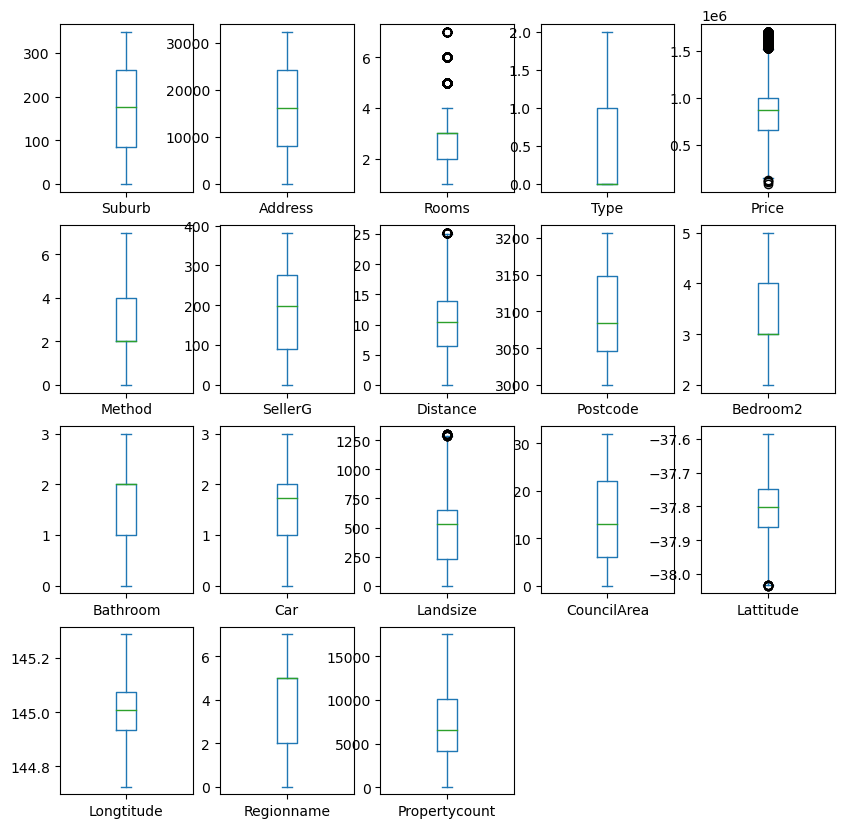

In [71]:
filtered.plot(kind = "box" , subplots = True , figsize = (10,10) , layout = (4,5))

In [72]:
exp.box(filtered['Price'])

In [29]:
filtered.isnull().sum()

Suburb               0
Address              0
Rooms               31
Type                 0
Price             2042
Method             133
SellerG              0
Date             33136
Distance          1419
Postcode           927
Bedroom2          1450
Bathroom           371
Car               1514
Landsize           827
CouncilArea          0
Lattitude          783
Longtitude        1211
Regionname           0
Propertycount      802
dtype: int64

In [32]:
no_outlier

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,0,27971,2,0,870000.0,6,155,3/9/2016,2.5,3067.0,2.0,1.0,1.000000,126.0,31,-37.80140,144.99580,2,4019.0
1,0,30908,2,0,1480000.0,2,33,3/12/2016,2.5,3067.0,2.0,1.0,1.000000,202.0,31,-37.79960,144.99840,2,4019.0
2,0,14570,2,0,1035000.0,2,33,4/2/2016,2.5,3067.0,2.0,1.0,0.000000,156.0,31,-37.80790,144.99340,2,4019.0
3,0,9274,3,2,870000.0,7,295,4/2/2016,2.5,3067.0,3.0,2.0,1.000000,0.0,31,-37.81140,145.01160,2,4019.0
4,0,23829,3,0,1465000.0,5,33,4/3/2017,2.5,3067.0,3.0,2.0,0.000000,134.0,31,-37.80930,144.99440,2,4019.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34852,346,5516,4,0,1480000.0,0,152,24/02/2018,6.3,3013.0,4.0,1.0,3.000000,593.0,16,-37.81053,144.88467,6,6543.0
34853,346,16106,2,0,888000.0,5,319,24/02/2018,6.3,3013.0,2.0,2.0,1.000000,98.0,16,-37.81551,144.88826,6,6543.0
34854,346,6952,2,1,705000.0,2,152,24/02/2018,6.3,3013.0,2.0,1.0,2.000000,220.0,16,-37.82286,144.87856,6,6543.0
34855,346,5088,3,0,1140000.0,5,366,24/02/2018,6.3,3013.0,2.0,2.0,1.728845,250.0,16,-37.82286,144.87856,6,6543.0


In [27]:
no_outlier.to_csv(r'C:\Samsung tasks\Day 12\filtered_data.csv',index = False)

In [28]:
no_outlier

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,0,27971,2,0,870000.0,6,155,3/9/2016,2.5,3067.0,2.0,1.0,1.000000,126.0,31,-37.80140,144.99580,2,4019.0
1,0,30908,2,0,1480000.0,2,33,3/12/2016,2.5,3067.0,2.0,1.0,1.000000,202.0,31,-37.79960,144.99840,2,4019.0
2,0,14570,2,0,1035000.0,2,33,4/2/2016,2.5,3067.0,2.0,1.0,0.000000,156.0,31,-37.80790,144.99340,2,4019.0
3,0,9274,3,2,870000.0,7,295,4/2/2016,2.5,3067.0,3.0,2.0,1.000000,0.0,31,-37.81140,145.01160,2,4019.0
4,0,23829,3,0,1465000.0,5,33,4/3/2017,2.5,3067.0,3.0,2.0,0.000000,134.0,31,-37.80930,144.99440,2,4019.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34852,346,5516,4,0,1480000.0,0,152,24/02/2018,6.3,3013.0,4.0,1.0,3.000000,593.0,16,-37.81053,144.88467,6,6543.0
34853,346,16106,2,0,888000.0,5,319,24/02/2018,6.3,3013.0,2.0,2.0,1.000000,98.0,16,-37.81551,144.88826,6,6543.0
34854,346,6952,2,1,705000.0,2,152,24/02/2018,6.3,3013.0,2.0,1.0,2.000000,220.0,16,-37.82286,144.87856,6,6543.0
34855,346,5088,3,0,1140000.0,5,366,24/02/2018,6.3,3013.0,2.0,2.0,1.728845,250.0,16,-37.82286,144.87856,6,6543.0
